# RFM Analysis of retail sales data

In [412]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [413]:
# reading the csv file 
df = pd.read_csv('RFM Analysis of online retail data.csv')

In [414]:
df.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,1.12.2009 07:45,"6,95",13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,1.12.2009 07:45,"6,75",13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,1.12.2009 07:45,"6,75",13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,1.12.2009 07:45,"2,1",13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,1.12.2009 07:45,"1,25",13085.0,United Kingdom


In [415]:
# Information about columns and its data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 8 columns):
 #   Column       Non-Null Count    Dtype  
---  ------       --------------    -----  
 0   Invoice      1048575 non-null  object 
 1   StockCode    1048575 non-null  object 
 2   Description  1044203 non-null  object 
 3   Quantity     1048575 non-null  int64  
 4   InvoiceDate  1048575 non-null  object 
 5   Price        1048575 non-null  object 
 6   Customer ID  811893 non-null   float64
 7   Country      1048575 non-null  object 
dtypes: float64(1), int64(1), object(6)
memory usage: 64.0+ MB


In [416]:
# Changing datatype of InvoiceDate
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

In [417]:
# replacing comma(,) with point(.) in price column
df['Price'] = df['Price'].str.replace(',','.')

In [418]:
#changing the datatype of price
df['Price'] = df['Price'].astype(str).astype(float)

In [419]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 8 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   Invoice      1048575 non-null  object        
 1   StockCode    1048575 non-null  object        
 2   Description  1044203 non-null  object        
 3   Quantity     1048575 non-null  int64         
 4   InvoiceDate  1048575 non-null  datetime64[ns]
 5   Price        1048575 non-null  float64       
 6   Customer ID  811893 non-null   float64       
 7   Country      1048575 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 64.0+ MB


In [420]:
# checks which variables have null values
df.isnull().sum()

Invoice             0
StockCode           0
Description      4372
Quantity            0
InvoiceDate         0
Price               0
Customer ID    236682
Country             0
dtype: int64

In [421]:
# Showing dataframe where Description column is null
df[df['Description'].isnull()]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
470,489521,21646,NaN,-50,2009-01-12 11:44:00,0.0,NaN,United Kingdom
3114,489655,20683,NaN,-44,2009-01-12 17:26:00,0.0,NaN,United Kingdom
3161,489659,21350,NaN,230,2009-01-12 17:39:00,0.0,NaN,United Kingdom
3731,489781,84292,NaN,17,2009-02-12 11:45:00,0.0,NaN,United Kingdom
4296,489806,18010,NaN,-770,2009-02-12 12:42:00,0.0,NaN,United Kingdom
4566,489821,85049G,NaN,-240,2009-02-12 13:25:00,0.0,NaN,United Kingdom
6378,489882,35751C,NaN,12,2009-02-12 16:22:00,0.0,NaN,United Kingdom
6555,489898,79323G,NaN,954,2009-03-12 09:40:00,0.0,NaN,United Kingdom
6576,489901,21098,NaN,-200,2009-03-12 09:47:00,0.0,NaN,United Kingdom
6581,489903,21166,NaN,48,2009-03-12 09:57:00,0.0,NaN,United Kingdom


In [422]:
# Replaces null values with the value from the previous row after doing groupby stockcode as in description of item is 
# for a perticular stockcode ( usefull if its a last empty row)

df['Description'].fillna(value=df['Description'].groupby(df['StockCode']).ffill(),inplace=True)

In [423]:
# Replaces null values with the value from the next row after doing groupby stockcode as in description of item is 
# for a perticular stockcode  ( usefull if its a first empty row)

df['Description'].fillna(value=df['Description'].groupby(df['StockCode']).bfill(),inplace=True)

In [424]:
# where a particular stockcode has no Description

df['Description'].fillna(value='Description not available',inplace=True) 

In [425]:
# to fill if any customer ID for a particular invoice is empty

df['Customer ID'].fillna(value=df['Customer ID'].groupby(df['Invoice']).bfill(),inplace=True)
df['Customer ID'].fillna(value=df['Customer ID'].groupby(df['Invoice']).bfill(),inplace=True)

In [426]:
# count of null values for customerID still remains the same even after bfill or ffill
df.isnull().sum()

Invoice             0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
Price               0
Customer ID    236682
Country             0
dtype: int64

In [427]:
#to check count of Invoices
df['Invoice'].value_counts()

537434     1350
538071     1304
537638     1202
537237     1194
536876     1186
536592     1184
537823     1182
537240     1136
573585     1114
537666     1072
536544     1054
558475      705
579777      687
580367      650
580115      645
578344      622
538349      620
578347      606
576617      593
576837      585
536031      582
490074      580
491966      579
579508      578
577078      572
577358      561
490149      559
576618      552
491969      548
490741      546
576840      544
576339      542
579187      541
538177      534
579196      533
578844      527
575930      526
577768      526
578827      520
576329      518
539437      518
575176      518
489857      516
575477      515
513574      515
539958      512
490745      507
575875      503
579512      503
489597      502
540551      502
535835      501
491155      500
492414      498
578065      494
538524      490
559055      487
532642      487
491970      486
492782      486
578067      486
491043      482
575739  

In [428]:
# statistical analysis of data
df.describe(include='all')

C:\Users\Admin\AppData\Local\Temp\ipykernel_6872\2884002236.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df.describe(include='all')


,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
count,1048575,1048575,1048575,1.048575e+06,1048575,1.048575e+06,811893.000000,1048575
unique,52961,5304,5698,NaN,47046,NaN,NaN,43
top,537434,85123A,WHITE HANGING HEART T-LIGHT HOLDER,NaN,2010-06-12 16:57:00,NaN,NaN,United Kingdom
freq,1350,5781,5875,NaN,1350,NaN,NaN,963819
first,NaN,NaN,NaN,NaN,2009-01-12 07:45:00,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,2011-12-10 17:19:00,NaN,NaN,NaN
mean,NaN,NaN,NaN,9.957525e+00,NaN,4.627346e+00,15324.712265,NaN
std,NaN,NaN,NaN,1.335187e+02,NaN,1.228024e+02,1697.033034,NaN
min,NaN,NaN,NaN,-7.421500e+04,NaN,-5.359436e+04,12346.000000,NaN
25%,NaN,NaN,NaN,1.000000e+00,NaN,1.250000e+00,13971.000000,NaN


<Axes: >

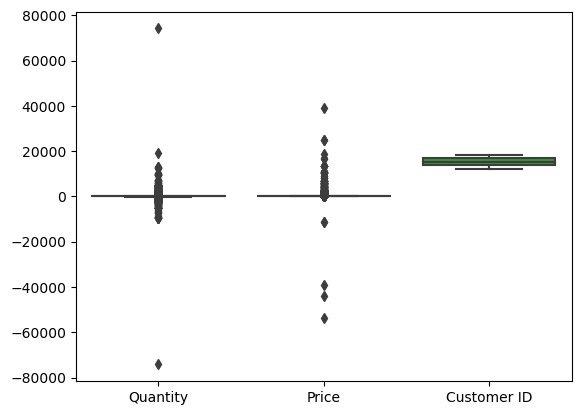

In [429]:
# to check for outliers
sns.boxplot(df)

In [430]:
# to check how many values have price less than -1000
df[df['Price']<= -1000].sort_values(by='Price')

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
179403,A506401,B,Adjust bad debt,1,2010-04-29 13:36:00,-53594.36,NaN,United Kingdom
276274,A516228,B,Adjust bad debt,1,2010-07-19 11:24:00,-44031.79,NaN,United Kingdom
403472,A528059,B,Adjust bad debt,1,2010-10-20 12:04:00,-38925.87,NaN,United Kingdom
825444,A563186,B,Adjust bad debt,1,2011-12-08 14:51:00,-11062.06,NaN,United Kingdom
825445,A563187,B,Adjust bad debt,1,2011-12-08 14:52:00,-11062.06,NaN,United Kingdom


# Task1

The first thing you need to do is to create an RFM view for each customer. What is RFM view?

You will need to compute the following for each customer:

1. The number of times a customer has made transactions. If in a single day a customer has made 3 transactions, count them as 3 separate transactions. This is the `frequency` in R`F`M


2. The total and average revenue per customer. To arrive at revenue, you will need to multiply the `Quantity` and `Price` columns. You will also need to clean the `Price` column for any data quality issues. This will become the `monetary` term in RF`M`


3. Lastly you will need to find the recency of the last purchase. This can be computed by finding the number of days that have elapsed from the last purchase each customer has made. You can use a base date of `01/01/2012` to compute recency. Find out the number of days elapsed from `01/01/2012` for each customer's most recent purchase.


# Frequency

In [431]:
# Number of times customer has made a transaction
freq = pd.DataFrame(df.groupby('Customer ID')['Customer ID'].count()[::-1])
freq.rename(columns={'Customer ID':'Frequency'},inplace=True)

In [432]:
freq.reset_index(level=0,inplace=True)

In [433]:
freq

,Customer ID,Frequency
0,18287.0,156
1,18286.0,70
2,18285.0,12
3,18284.0,29
4,18283.0,936
5,18282.0,13
6,18281.0,17
7,18280.0,32
8,18279.0,13
9,18278.0,24


# Monetary

In [434]:
# Monetary is nothing but Revenue generated 
df['Monetary'] = df['Quantity']*df['Price']

In [435]:
df.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Monetary
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-01-12 07:45:00,6.95,13085.0,United Kingdom,83.4
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-01-12 07:45:00,6.75,13085.0,United Kingdom,81.0
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-01-12 07:45:00,6.75,13085.0,United Kingdom,81.0
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-01-12 07:45:00,2.10,13085.0,United Kingdom,100.8
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-01-12 07:45:00,1.25,13085.0,United Kingdom,30.0


In [436]:
# Calculates Total revenvue and Average revenue per customer

monetary = pd.DataFrame(df['Monetary'].groupby(df['Customer ID']).agg(['sum','mean'])[::-1])
monetary.rename(columns={'sum':'Tot_Rev','mean':'Avg_Rev'},inplace=True)
monetary.reset_index(level=0,inplace=True)

In [437]:
monetary

,Customer ID,Tot_Rev,Avg_Rev
0,18287.0,4.177890e+03,2.678135e+01
1,18286.0,1.188430e+03,1.697757e+01
2,18285.0,4.270000e+02,3.558333e+01
3,18284.0,4.366800e+02,1.505793e+01
4,18283.0,2.528650e+03,2.701549e+00
5,18282.0,1.766000e+02,1.358462e+01
6,18281.0,2.011400e+02,1.183176e+01
7,18280.0,4.724500e+02,1.476406e+01
8,18279.0,2.313400e+02,1.779538e+01
9,18278.0,4.142000e+02,1.725833e+01


# Recency

In [438]:
from datetime import date

In [439]:
base_date = date(2012, 1, 1)
base_date = pd.to_datetime(base_date)
base_date

Timestamp('2012-01-01 00:00:00')

In [440]:
# Calculates how recently the customer has made a transaction  

recency = pd.DataFrame(base_date - df['InvoiceDate'].groupby(df['Customer ID']).max()[::-1])
recency.rename(columns={"InvoiceDate": "Duration"}, inplace = True)
recency.reset_index(level=0,inplace=True)
recency

,Customer ID,Duration
0,18287.0,21 days 13:37:00
1,18286.0,498 days 12:03:00
2,18285.0,682 days 13:36:00
3,18284.0,569 days 11:29:00
4,18283.0,31 days 11:01:00
5,18282.0,114 days 08:50:00
6,18281.0,25 days 13:07:00
7,18280.0,181 days 14:08:00
8,18279.0,511 days 09:12:00
9,18278.0,95 days 12:02:00


# RFM

In [441]:
# Merging the Recency, Frequency on customer ID 
rfm = pd.merge(recency,freq,how='inner',on='Customer ID')

In [442]:
# Merging previous rfm with monetary(Revenue) on customer ID 
rfm_view = pd.merge(me1,monetary,how='inner',on='Customer ID')

In [443]:
rfm_view

,Customer ID,Duration,Frequency,Tot_Rev,Avg_Rev
0,18287.0,21 days 13:37:00,156,4.177890e+03,2.678135e+01
1,18286.0,498 days 12:03:00,70,1.188430e+03,1.697757e+01
2,18285.0,682 days 13:36:00,12,4.270000e+02,3.558333e+01
3,18284.0,569 days 11:29:00,29,4.366800e+02,1.505793e+01
4,18283.0,31 days 11:01:00,936,2.528650e+03,2.701549e+00
5,18282.0,114 days 08:50:00,13,1.766000e+02,1.358462e+01
6,18281.0,25 days 13:07:00,17,2.011400e+02,1.183176e+01
7,18280.0,181 days 14:08:00,32,4.724500e+02,1.476406e+01
8,18279.0,511 days 09:12:00,13,2.313400e+02,1.779538e+01
9,18278.0,95 days 12:02:00,24,4.142000e+02,1.725833e+01


In [444]:
# To check the shape after merging of dataframe 
rfm_view.shape

(5924, 5)

# Task 2

Once you have the RFM table, you will need to analyze this table further.

One of the things you can analyze is to find the `vintage` of customers. You can find out for which ranges of recency, is the company realizing around 75% of the total revenue.

In the end you should obtain a view similar to the one given below:


In [445]:
# below codes splits duration into 10 deciles and calculates the Total Revenue of each Decile as Tot_Rev

range_of_recency = pd.DataFrame(rfm_view['Tot_Rev'].groupby(pd.qcut(rfm_view['Duration'], q=10)).agg(['sum'])).reset_index()
range_of_recency.rename(columns={'Duration':'Recency_Deciles','sum':'Tot_Rev'},inplace=True)
range_of_recency

,Recency_Deciles,Tot_Rev
0,"(21 days 06:40:59.999999999, 32 days 12:04:36]",5711857.734
1,"(32 days 12:04:36, 43 days 13:59:12]",2968252.921
2,"(43 days 13:59:12, 61 days 10:34:24.000000001]",2275605.871
3,"(61 days 10:34:24.000000001, 87 days 18:32:36....",1533952.931
4,"(87 days 18:32:36.000000017, 135 days 08:26:00]",1262303.344
5,"(135 days 08:26:00, 216 days 09:30:36.000000004]",965468.294
6,"(216 days 09:30:36.000000004, 345 days 09:39:30]",586407.400
7,"(345 days 09:39:30, 436 days 12:19:24]",536943.362
8,"(436 days 12:19:24, 557 days 12:04:00]",398391.840
9,"(557 days 12:04:00, 1083 days 14:05:00]",164913.601


In [446]:
# Calculates Cumulative Revenue, Total Revenue across deciles, Percentage of Total Revenue per decile 

range_of_recency['CumSum_Rev'] = range_of_recency['Tot_Rev'].cumsum()
range_of_recency['Total_Rev_Across_Deciles'] = range_of_recency['Tot_Rev'].sum()
range_of_recency['Perc_tot_Rev'] = range_of_recency['CumSum_Rev']/range_of_recency['Total_Rev_Across_Deciles']

In [447]:
range_of_recency

,Recency_Deciles,Tot_Rev,CumSum_Rev,Total_Rev_Across_Deciles,Perc_tot_Rev
0,"(21 days 06:40:59.999999999, 32 days 12:04:36]",5711857.734,5.711858e+06,1.640410e+07,0.348197
1,"(32 days 12:04:36, 43 days 13:59:12]",2968252.921,8.680111e+06,1.640410e+07,0.529143
2,"(43 days 13:59:12, 61 days 10:34:24.000000001]",2275605.871,1.095572e+07,1.640410e+07,0.667865
3,"(61 days 10:34:24.000000001, 87 days 18:32:36....",1533952.931,1.248967e+07,1.640410e+07,0.761375
4,"(87 days 18:32:36.000000017, 135 days 08:26:00]",1262303.344,1.375197e+07,1.640410e+07,0.838325
5,"(135 days 08:26:00, 216 days 09:30:36.000000004]",965468.294,1.471744e+07,1.640410e+07,0.897181
6,"(216 days 09:30:36.000000004, 345 days 09:39:30]",586407.400,1.530385e+07,1.640410e+07,0.932928
7,"(345 days 09:39:30, 436 days 12:19:24]",536943.362,1.584079e+07,1.640410e+07,0.965661
8,"(436 days 12:19:24, 557 days 12:04:00]",398391.840,1.623918e+07,1.640410e+07,0.989947
9,"(557 days 12:04:00, 1083 days 14:05:00]",164913.601,1.640410e+07,1.640410e+07,1.000000


In [448]:
# 75% of total revenue is achieved upto what ranges of recency

(75/100)* range_of_recency['Total_Rev_Across_Deciles'][0]

12303072.973500002

#### Above value falls under (61 days 10:34:24.000000001, 87 days 18:32:36..] recency category 
#### To get subset of data which includes the above decile changed the percent to 77 instead of 75 

In [393]:
vintage_customer = range_of_recency[range_of_recency['CumSum_Rev'] <= (77/100)* range_of_recency['Total_Rev_Across_Deciles'][0]]
vintage_customer

,Recency_Deciles,Tot_Rev,CumSum_Rev,Total_Rev_Across_Deciles,Perc_tot_Rev
0,"(21 days 06:40:59.999999999, 32 days 12:04:36]",5711857.734,5.711858e+06,1.640410e+07,0.348197
1,"(32 days 12:04:36, 43 days 13:59:12]",2968252.921,8.680111e+06,1.640410e+07,0.529143
2,"(43 days 13:59:12, 61 days 10:34:24.000000001]",2275605.871,1.095572e+07,1.640410e+07,0.667865
3,"(61 days 10:34:24.000000001, 87 days 18:32:36....",1533952.931,1.248967e+07,1.640410e+07,0.761375


##### Above table tells us that the 75% of total revenue is achieved by the customers whose purchase history is between 21 days to ~87 days they are called as vintage_customer since they have been purchasing from the company within the time frame frequently 

# Task3

Once you have identified the customers by their recency and how much revenue these customers bring, the next task is to find out within the subset of data identified above, for what ranges of frequency is ~65% of the revenue in the subset realized.

After you do this task, you should obtain a view as given below:


In [449]:
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)

In [450]:
# Copying rfm_view dataframe as to not disturb the original rfm_view dataframe
rfm2 = rfm_view.copy()

In [451]:
# Creating of Recency and Frequency Deciles

rfm2['Receny_dec'] = pd.qcut(me2['Duration'],q=10)
rfm2['Freq-dec'] = pd.qcut(me2['Frequency'],q=10)
rfm2

,Customer ID,Duration,Frequency,Tot_Rev,Avg_Rev,Receny_dec,Freq-dec
0,18287.0,21 days 13:37:00,156,4.177890e+03,2.678135e+01,"(21 days 06:40:59.999999999, 32 days 12:04:36]","(114.0, 180.0]"
1,18286.0,498 days 12:03:00,70,1.188430e+03,1.697757e+01,"(436 days 12:19:24, 557 days 12:04:00]","(53.0, 76.0]"
2,18285.0,682 days 13:36:00,12,4.270000e+02,3.558333e+01,"(557 days 12:04:00, 1083 days 14:05:00]","(8.0, 16.0]"
3,18284.0,569 days 11:29:00,29,4.366800e+02,1.505793e+01,"(557 days 12:04:00, 1083 days 14:05:00]","(25.0, 37.0]"
4,18283.0,31 days 11:01:00,936,2.528650e+03,2.701549e+00,"(21 days 06:40:59.999999999, 32 days 12:04:36]","(319.7, 12780.0]"
5,18282.0,114 days 08:50:00,13,1.766000e+02,1.358462e+01,"(87 days 18:32:36.000000017, 135 days 08:26:00]","(8.0, 16.0]"
6,18281.0,25 days 13:07:00,17,2.011400e+02,1.183176e+01,"(21 days 06:40:59.999999999, 32 days 12:04:36]","(16.0, 25.0]"
7,18280.0,181 days 14:08:00,32,4.724500e+02,1.476406e+01,"(135 days 08:26:00, 216 days 09:30:36.000000004]","(25.0, 37.0]"
8,18279.0,511 days 09:12:00,13,2.313400e+02,1.779538e+01,"(436 days 12:19:24, 557 days 12:04:00]","(8.0, 16.0]"
9,18278.0,95 days 12:02:00,24,4.142000e+02,1.725833e+01,"(87 days 18:32:36.000000017, 135 days 08:26:00]","(16.0, 25.0]"


#### According to the subset of values obtained in task2 the end Recency decile is 87 days we will be filtering the rows which contains duration less than '87 days 18:32:36.000000017'

In [452]:
# creating subset of data 
sub_rfm = rfm2[rfm2['Duration'] <= '87 days 18:32:36.000000017']
sub_rfm.shape

(2370, 7)

In [453]:
# below code does groupby Frequency Decile and calculates Total Revenue as Tot_Rev per Frequency decile
range_of_frequency = pd.DataFrame(sub_rfm.groupby('Freq-dec')['Tot_Rev'].sum()).reset_index()
range_of_frequency.rename(columns={'Freq-dec':'Frequency_Deciles'},inplace=True)
range_of_frequency

,Frequency_Deciles,Tot_Rev
0,"(0.999, 8.0]",33444.130
1,"(8.0, 16.0]",63917.290
2,"(16.0, 25.0]",83236.670
3,"(25.0, 37.0]",134151.150
4,"(37.0, 53.0]",202161.950
5,"(53.0, 76.0]",374664.510
6,"(76.0, 114.0]",546470.850
7,"(114.0, 180.0]",992185.561
8,"(180.0, 319.7]",2157491.621
9,"(319.7, 12780.0]",7901945.725


In [454]:
# Calculates Cumulative Revenue, Total Revenue across deciles, Percentage of Total Revenue per Frequency decile 
 
range_of_frequency['CumSum'] = range_of_frequency['Tot_Rev'].cumsum()
range_of_frequency['Total'] = range_of_frequency['Tot_Rev'].sum()
range_of_frequency['Perc_Total'] = range_of_frequency['CumSum']/range_of_frequency['Total']
range_of_frequency


,Frequency_Deciles,Tot_Rev,CumSum,Total,Perc_Total
0,"(0.999, 8.0]",33444.130,3.344413e+04,1.248967e+07,0.002678
1,"(8.0, 16.0]",63917.290,9.736142e+04,1.248967e+07,0.007795
2,"(16.0, 25.0]",83236.670,1.805981e+05,1.248967e+07,0.014460
3,"(25.0, 37.0]",134151.150,3.147492e+05,1.248967e+07,0.025201
4,"(37.0, 53.0]",202161.950,5.169112e+05,1.248967e+07,0.041387
5,"(53.0, 76.0]",374664.510,8.915757e+05,1.248967e+07,0.071385
6,"(76.0, 114.0]",546470.850,1.438047e+06,1.248967e+07,0.115139
7,"(114.0, 180.0]",992185.561,2.430232e+06,1.248967e+07,0.194579
8,"(180.0, 319.7]",2157491.621,4.587724e+06,1.248967e+07,0.367321
9,"(319.7, 12780.0]",7901945.725,1.248967e+07,1.248967e+07,1.000000


In [455]:
(65/100)* range_of_frequency['Total'][0]

8118285.147049999